Link to the Dataset used -> https://www.kaggle.com/datasets/soumikrakshit/anime-faces

In [1]:
import os 
import numpy as np
import pandas as pd
import warnings
from tqdm.notebook import tqdm
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, array_to_img
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.losses import BinaryCrossentropy
import matplotlib.pyplot as plt
from PIL import Image
warnings.filterwarnings('ignore')

In [2]:
BASE_DIR = 'data'

image_paths = []
for image_name in os.listdir(BASE_DIR):
    image_path = os.path.join(BASE_DIR, image_name)
    image_paths.append(image_path)

image_paths[:5]

len(image_paths)

image_paths.remove('data\data')

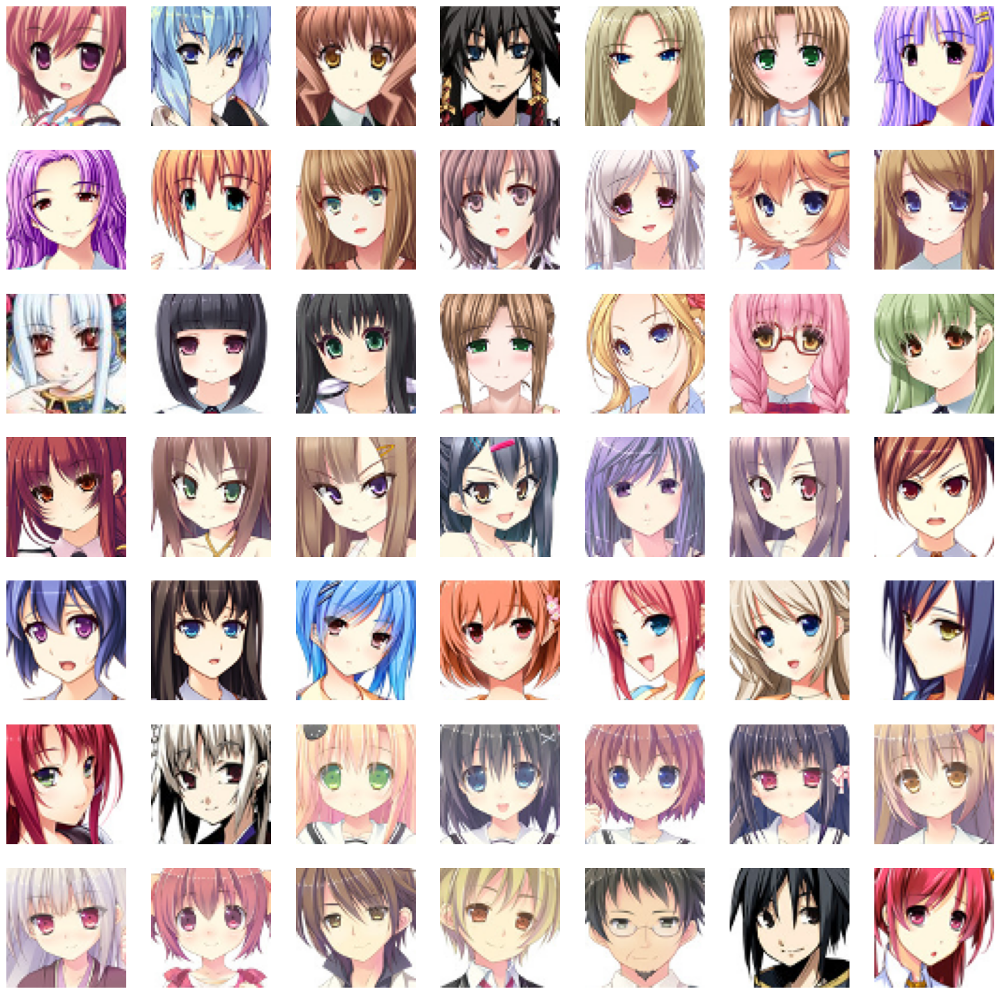

In [3]:
# 
plt.figure(figsize =(20,20))
temp_images = image_paths[:49]
index = 1

for image_path in temp_images:
    plt.subplot(7,7, index)
    img = Image.open(image_path)
    img = np.array(img)
    plt.imshow(img)
    plt.axis('off')
    index+=1
    

In [4]:
from tqdm.notebook import tqdm

# Load images and convert to numpy array
train_images = [np.array(load_img(path)) for path in tqdm(image_paths)]
train_images = np.array(train_images)



  0%|          | 0/21551 [00:00<?, ?it/s]

In [6]:
train_images[1].shape

# Reshape the array
train_images = train_images.reshape(train_images.shape[0], 64,64,3).astype('float32')

# Normalize the images
# We are normalizing it from -1 to 1 as our final activation funciton is going to be tanh which ranges from -1 to 1
train_images = (train_images -127.5)/127.5

train_images[0]

array([[[ 0.94509804,  0.42745098,  0.24705882],
        [ 0.96862745,  0.44313726,  0.33333334],
        [ 0.9529412 ,  0.5058824 ,  0.35686275],
        ...,
        [ 0.38039216, -0.38039216, -0.19215687],
        [ 0.43529412, -0.34117648, -0.15294118],
        [ 0.49019608, -0.1764706 , -0.02745098]],

       [[ 0.90588236,  0.43529412,  0.23137255],
        [ 0.92941177,  0.43529412,  0.3254902 ],
        [ 0.9529412 ,  0.44313726,  0.35686275],
        ...,
        [ 0.33333334, -0.3647059 , -0.19215687],
        [ 0.39607844, -0.37254903, -0.16862746],
        [ 0.35686275, -0.3647059 , -0.19215687]],

       [[ 0.8980392 ,  0.4117647 ,  0.2627451 ],
        [ 0.96862745,  0.4745098 ,  0.33333334],
        [ 0.75686276,  0.14509805,  0.16078432],
        ...,
        [ 0.40392157, -0.31764707, -0.12156863],
        [ 0.38039216, -0.37254903, -0.16078432],
        [ 0.35686275, -0.40392157, -0.20784314]],

       ...,

       [[ 1.        ,  1.        ,  1.        ],
        [ 1

## Create Generator & Discriminator Models

In [7]:
# latent dimensions for random noise
LATENT_DIM = 100 # if we increase the dim we will get better results but the computational cost will increase

# weight initializer

WEIGHT_INIT = keras.initializers.RandomNormal(mean = 0.0, stddev = 0.02)

# no. of channels of the image
CHANNELS=3

# Generator Model

In [8]:
model = Sequential(name = 'generator')

# 1d random noise
model.add(layers.Dense(8*8*512,input_dim = LATENT_DIM))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())
# convert 1d to 3d
model.add(layers.Reshape((8,8,512)))

# upsample to 16x16
model.add(layers.Conv2DTranspose(256, (4,4), strides = (2,2), padding = 'same', kernel_initializer = WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# upsample to 32x32
model.add(layers.Conv2DTranspose(128, (4,4), strides = (2,2), padding = 'same', kernel_initializer = WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# upsample to 64x64
model.add(layers.Conv2DTranspose(64, (4,4), strides = (2,2), padding = 'same', kernel_initializer = WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

model.add(layers.Conv2D(CHANNELS, (4,4), padding = 'same', activation = 'tanh'))

generator =model
generator.summary()


Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32768)             3309568   
                                                                 
 re_lu (ReLU)                (None, 32768)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 16, 16, 256)      2097408   
 nspose)                                                         
                                                                 
 re_lu_1 (ReLU)              (None, 16, 16, 256)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 32, 32, 128)      524416    
 ranspose)                                               

### Discriminator Model

In [9]:
def build_discriminator():
    inputs = layers.Input(shape=(64, 64, 3))
    x = layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    
    x = layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    
    x = layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    
    # x = layers.Conv2D(512, (4, 4), strides=(2, 2), padding='same', use_bias=False)(inputs)
    #x = layers.BatchNormalization()(x)
    # x = layers.LeakyReLU(alpha=0.2)(x)
    
    feature = layers.Flatten()(x)
    feature=layers.Dropout(0.3)(feature)

    output = layers.Dense(1,activation='sigmoid')(feature)
    
    return keras.Model(inputs, [output, feature])
discriminator=build_discriminator()
discriminator.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        3072      
                                                                 
 batch_normalization (BatchN  (None, 32, 32, 64)       256       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 128)       131072    
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 128)      512       
 hNormalization)                                             

### Create DCGAN

In [10]:
class DCGAN(keras.Model):
    def __init__(self,generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim 
        self.g_loss_metric = keras.metrics.Mean(name = 'g_loss') # generator loss
        self.d_loss_metric = keras.metrics.Mean(name = 'd_loss') # Discriminator loss
        
    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric]
    
    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn
        
    def train_step(self, real_images):
        # get batch size from the data
        batch_size = tf.shape(real_images)[0]
        # generator random noise
        random_noise = tf.random.normal(shape = (batch_size, self.latent_dim))
        
        # train the discriminator with real (1) and fake(0) images
        with tf.GradientTape() as tape:
            # compute loss on real images
            pred_real,feature_real = self.discriminator(real_images, training = True)
            # generate real images labels
            real_labels = tf.ones((batch_size, 1))
            # label smoothing
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))
            d_loss_real = self.loss_fn(real_labels, pred_real)
            
            # compute loss on fake images
            fake_images = self.generator(random_noise)
            pred_fake, feature_fake = self.discriminator(fake_images, training = True)
            # generator fake labels
            fake_labels = tf.zeros((batch_size, 1))
            
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)
            
            # total discriminator loss
            d_loss = (d_loss_real + d_loss_fake)/2
            
        # compute discriminator gradients
        gradient  = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # update the gradients
        self.d_optimizer.apply_gradients(zip(gradient, self.discriminator.trainable_variables))
        
        #train the generator model
        labels =tf.ones((batch_size, 1))
        
        # generator want discriminator to think that fake images are real
        with tf.GradientTape() as tape:
            # generate fake images from generator
            fake_images = self.generator(random_noise, training = True)
            # classify images as real or fake 
            pred_fake, feature_fake = self.discriminator(fake_images, training = True)
            # compute loss
            # g_loss = self.loss_fn(labels, pred_fake)
            feature_real_mean = tf.reduce_mean(feature_real, axis=0)
            feature_fake_mean = tf.reduce_mean(feature_fake, axis=0)
            g_loss = tf.reduce_mean(tf.square(feature_real_mean - feature_fake_mean))
            
        # compute gradients
        gradients = tape.gradient(g_loss, self.generator.trainable_variables)
        #update the gradients
        self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))
        
        # update states for both models
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        
        return {'d_loss': self.d_loss_metric.result(), 'g_loss': self.g_loss_metric.result()}
            
            
            

In [11]:
class DCGANMonitor(keras.callbacks.Callback):
    def __init__(self, num_imgs = 4, latent_dim = 100):
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
        
        #create random noise for generator images
        self.noise =tf.random.normal([25,latent_dim])
        
    def on_epoch_end(self, epoch, logs = None):
        g_img = self.model.generator(self.noise)
        
        # denormalize the image 
        g_img = (g_img*127.5 ) +127.5
        g_img.numpy()
        
        fig = plt.figure(figsize = (8,8))
        for i in range(self.num_imgs):
            plt.subplot(5,5,i+1)
            img = array_to_img(g_img[i])
            plt.imshow(img)
            plt.axis('off')
        # plt.savefig('epoch_{:03d}.png'.format(epoch))
        plt.show()
        
    def on_train_end(self, logs = None):
        self.model.generator.save('generator.h5')

In [12]:
dcgan = DCGAN(generator = generator, discriminator = discriminator, latent_dim = LATENT_DIM)


In [13]:

D_LR = 0.0001
G_LR = 0.0003
dcgan.compile(g_optimizer = Adam(learning_rate = G_LR, beta_1 = 0.5), d_optimizer =Adam(learning_rate = D_LR, beta_1 = 0.5), loss_fn = BinaryCrossentropy())

Epoch 1/50
674/674 [==============================] - ETA: 0s - d_loss: -0.1772 - g_loss: 0.1043

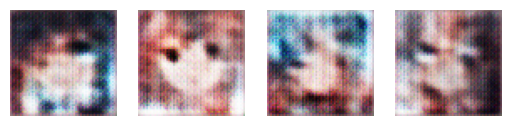

674/674 [==============================] - 66s 60ms/step - d_loss: -0.1772 - g_loss: 0.1043
Epoch 2/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0352 - g_loss: 0.0457

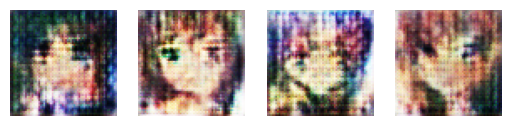

674/674 [==============================] - 39s 57ms/step - d_loss: -0.0353 - g_loss: 0.0458
Epoch 3/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0409 - g_loss: 0.0429

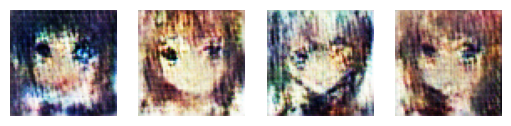

674/674 [==============================] - 39s 58ms/step - d_loss: -0.0410 - g_loss: 0.0430
Epoch 4/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0293 - g_loss: 0.0416

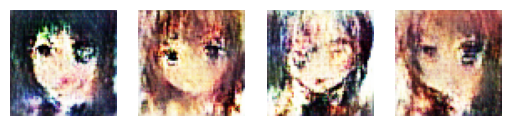

674/674 [==============================] - 39s 58ms/step - d_loss: -0.0294 - g_loss: 0.0417
Epoch 5/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0098 - g_loss: 0.0401

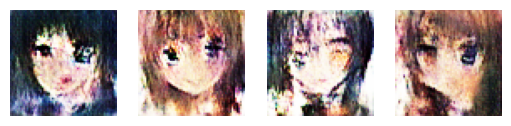

674/674 [==============================] - 39s 58ms/step - d_loss: -0.0099 - g_loss: 0.0402
Epoch 6/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0163 - g_loss: 0.0399

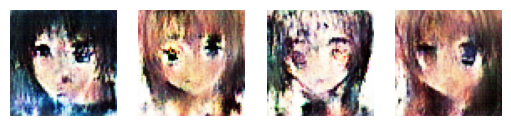

674/674 [==============================] - 39s 57ms/step - d_loss: -0.0164 - g_loss: 0.0399
Epoch 7/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0393 - g_loss: 0.0397

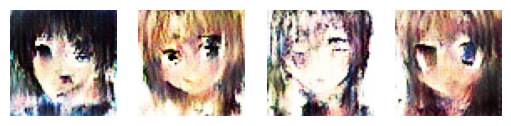

674/674 [==============================] - 38s 57ms/step - d_loss: -0.0391 - g_loss: 0.0398
Epoch 8/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0348 - g_loss: 0.0393

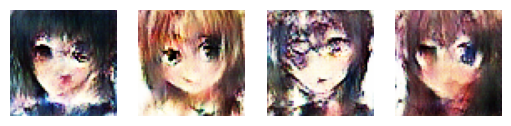

674/674 [==============================] - 39s 57ms/step - d_loss: -0.0349 - g_loss: 0.0394
Epoch 9/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0064 - g_loss: 0.0389

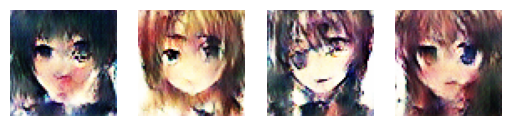

674/674 [==============================] - 39s 59ms/step - d_loss: -0.0065 - g_loss: 0.0389
Epoch 10/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0386 - g_loss: 0.0385

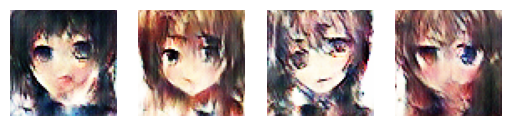

674/674 [==============================] - 39s 58ms/step - d_loss: -0.0384 - g_loss: 0.0385
Epoch 11/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0522 - g_loss: 0.0384

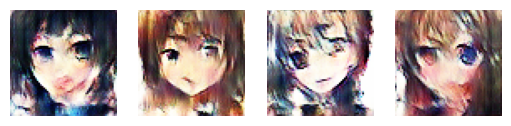

674/674 [==============================] - 39s 58ms/step - d_loss: -0.0519 - g_loss: 0.0385
Epoch 12/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0440 - g_loss: 0.0388

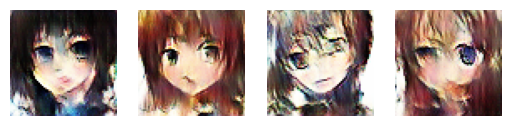

674/674 [==============================] - 38s 57ms/step - d_loss: -0.0441 - g_loss: 0.0388
Epoch 13/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0482 - g_loss: 0.0389

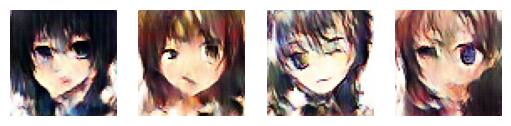

674/674 [==============================] - 39s 57ms/step - d_loss: -0.0483 - g_loss: 0.0390
Epoch 14/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0698 - g_loss: 0.0388

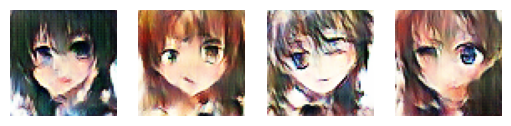

674/674 [==============================] - 39s 58ms/step - d_loss: -0.0699 - g_loss: 0.0389
Epoch 15/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0402 - g_loss: 0.0392

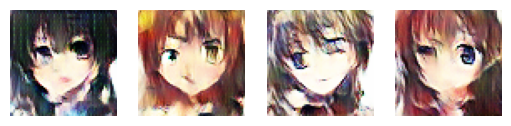

674/674 [==============================] - 39s 58ms/step - d_loss: -0.0403 - g_loss: 0.0393
Epoch 16/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0705 - g_loss: 0.0391

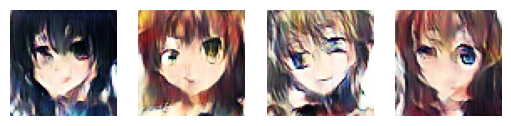

674/674 [==============================] - 39s 57ms/step - d_loss: -0.0705 - g_loss: 0.0392
Epoch 17/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0434 - g_loss: 0.0396

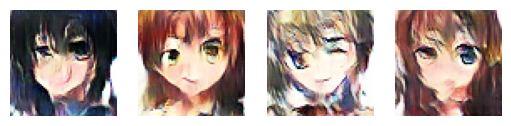

674/674 [==============================] - 39s 58ms/step - d_loss: -0.0434 - g_loss: 0.0397
Epoch 18/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0875 - g_loss: 0.0393

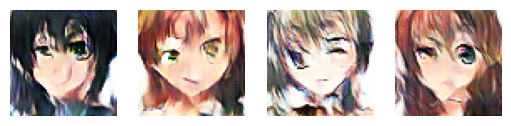

674/674 [==============================] - 39s 58ms/step - d_loss: -0.0876 - g_loss: 0.0394
Epoch 19/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0651 - g_loss: 0.0400

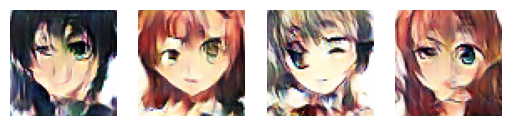

674/674 [==============================] - 38s 57ms/step - d_loss: -0.0651 - g_loss: 0.0400
Epoch 20/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0917 - g_loss: 0.0400

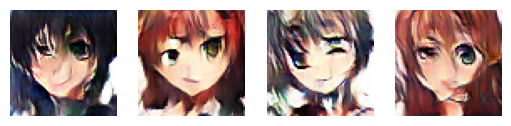

674/674 [==============================] - 38s 57ms/step - d_loss: -0.0918 - g_loss: 0.0401
Epoch 21/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0803 - g_loss: 0.0405

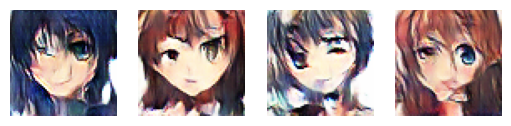

674/674 [==============================] - 38s 57ms/step - d_loss: -0.0802 - g_loss: 0.0405
Epoch 22/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0976 - g_loss: 0.0404

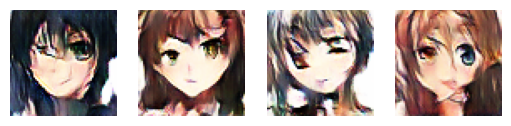

674/674 [==============================] - 39s 57ms/step - d_loss: -0.0973 - g_loss: 0.0405
Epoch 23/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0579 - g_loss: 0.0409

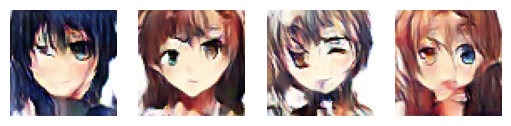

674/674 [==============================] - 39s 57ms/step - d_loss: -0.0580 - g_loss: 0.0409
Epoch 24/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1133 - g_loss: 0.0405

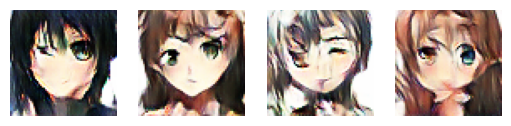

674/674 [==============================] - 39s 57ms/step - d_loss: -0.1131 - g_loss: 0.0405
Epoch 25/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1057 - g_loss: 0.0410

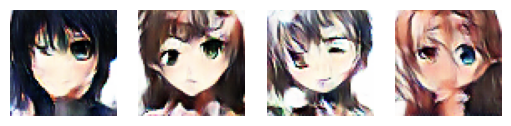

674/674 [==============================] - 39s 57ms/step - d_loss: -0.1058 - g_loss: 0.0411
Epoch 26/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0773 - g_loss: 0.0414

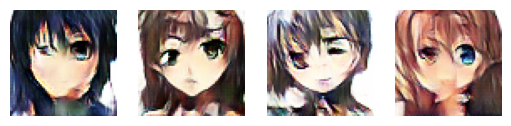

674/674 [==============================] - 40s 59ms/step - d_loss: -0.0774 - g_loss: 0.0415
Epoch 27/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1176 - g_loss: 0.0412

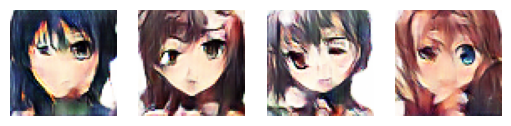

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1176 - g_loss: 0.0413
Epoch 28/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0919 - g_loss: 0.0415

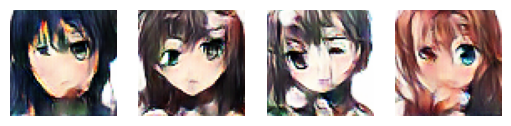

674/674 [==============================] - 38s 57ms/step - d_loss: -0.0921 - g_loss: 0.0416
Epoch 29/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1243 - g_loss: 0.0416

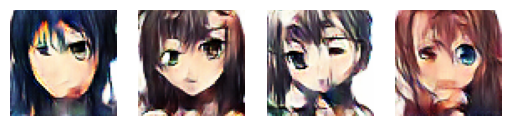

674/674 [==============================] - 39s 57ms/step - d_loss: -0.1243 - g_loss: 0.0416
Epoch 30/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1176 - g_loss: 0.0418

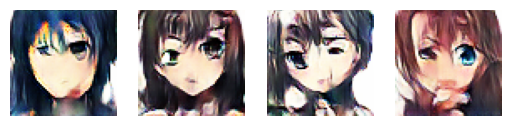

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1176 - g_loss: 0.0418
Epoch 31/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1241 - g_loss: 0.0420

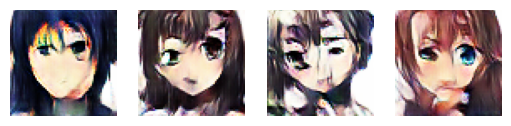

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1239 - g_loss: 0.0421
Epoch 32/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0808 - g_loss: 0.0418

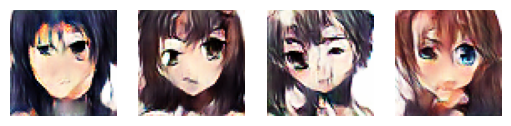

674/674 [==============================] - 38s 57ms/step - d_loss: -0.0809 - g_loss: 0.0419
Epoch 33/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1241 - g_loss: 0.0423

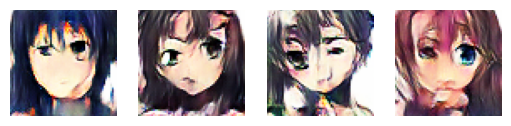

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1242 - g_loss: 0.0424
Epoch 34/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1342 - g_loss: 0.0422

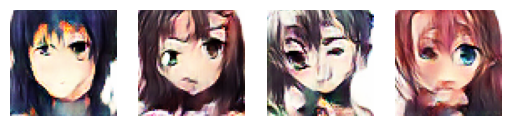

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1343 - g_loss: 0.0423
Epoch 35/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0965 - g_loss: 0.0423

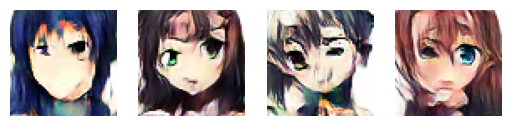

674/674 [==============================] - 38s 57ms/step - d_loss: -0.0963 - g_loss: 0.0423
Epoch 36/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1495 - g_loss: 0.0426

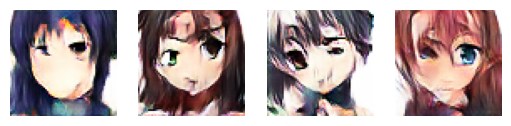

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1495 - g_loss: 0.0427
Epoch 37/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1131 - g_loss: 0.0428

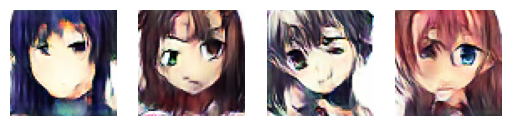

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1132 - g_loss: 0.0428
Epoch 38/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1292 - g_loss: 0.0432

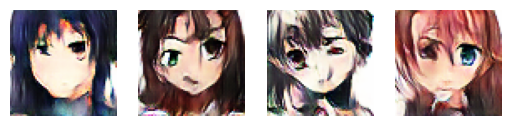

674/674 [==============================] - 39s 57ms/step - d_loss: -0.1293 - g_loss: 0.0432
Epoch 39/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1449 - g_loss: 0.0428

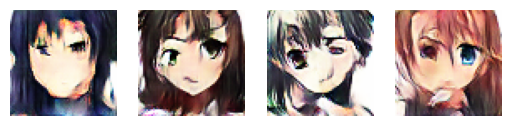

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1448 - g_loss: 0.0429
Epoch 40/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1403 - g_loss: 0.0432

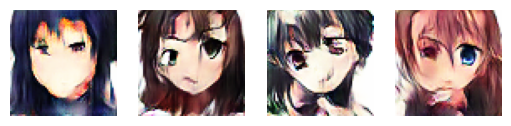

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1405 - g_loss: 0.0433
Epoch 41/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1217 - g_loss: 0.0432

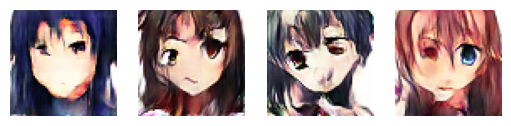

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1219 - g_loss: 0.0433
Epoch 42/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1616 - g_loss: 0.0433

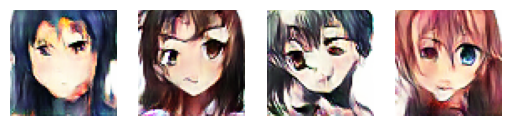

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1610 - g_loss: 0.0434
Epoch 43/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1528 - g_loss: 0.0438

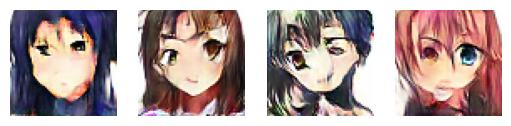

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1528 - g_loss: 0.0438
Epoch 44/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1310 - g_loss: 0.0441

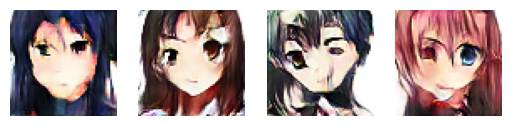

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1310 - g_loss: 0.0442
Epoch 45/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1697 - g_loss: 0.0436

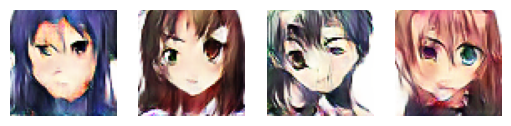

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1698 - g_loss: 0.0437
Epoch 46/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1725 - g_loss: 0.0443

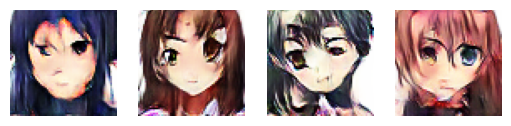

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1723 - g_loss: 0.0444
Epoch 47/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1707 - g_loss: 0.0445

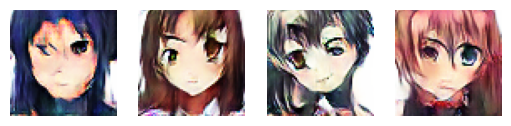

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1707 - g_loss: 0.0446
Epoch 48/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1683 - g_loss: 0.0449

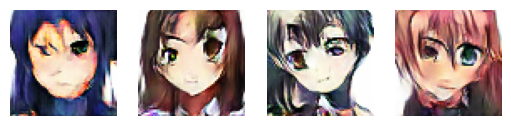

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1683 - g_loss: 0.0450
Epoch 49/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.1789 - g_loss: 0.0448

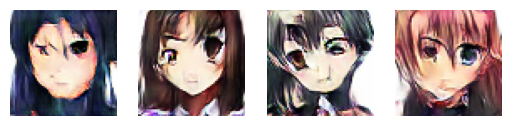

674/674 [==============================] - 38s 57ms/step - d_loss: -0.1790 - g_loss: 0.0448
Epoch 50/50
673/674 [============================>.] - ETA: 0s - d_loss: -0.0869 - g_loss: 0.0449

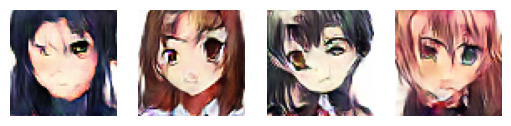

674/674 [==============================] - 38s 57ms/step - d_loss: -0.0872 - g_loss: 0.0450


In [14]:
# In this Latent_dim = 100 was used and batch normalization was removed from both gen and descriminator
N_EPOCHS = 50
dcgan.fit(train_images, epochs = N_EPOCHS, callbacks = [DCGANMonitor()])

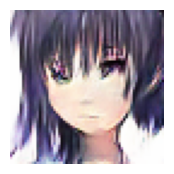

In [31]:
noise = tf.random.normal([1,100])
# generate the image from noise
plt.figure(figsize= (2,2))
g_img = generator(noise)
# denormalise the image
g_img = (g_img * 127.5)+127.5
g_img.numpy()
img = array_to_img(g_img[0])
plt.imshow(img)
plt.axis('off')

plt.show()